# Introduction <a name="introduction"></a>

This project is based on the paper DOI: 10.1103/PhysRevLett.93.178103. 

In this paper written by Kiyono et al. in 2004, it is found that the human heart rate (RR) shows scale invariance, which supports the idea that the human heart rate stays in a critical state. This project aims to confirm these results by repeating a similar methodology that was used in the research.

In this project, we used heart rate data of 10 healthy individuals of various ages and genders. The long-term RR data consist of sequential interbeat intervals, denoted as $b(i)$, where $i$ represents the beat number. To explore the probability density function (PDF) of heart rate increments across varying time scales, the analysis begins by removing non-stationary trends through local detrending.

Then, we build the increments from the detrended data and apply Gaussian and Castaing fit.

Lastly, we create a collapse plot to show the scale invariance of the data.

This process is repeated for each dataset.

The data we used was obtained from https://physionet.org/content/rr-interval-healthy-subjects/1.0.0/. 

The whole data consists of 147 healthy individuals, however, in this project, we used the data of 10 people. The people we chose are 5 male, and 5 female individuals with varying ages ranging from 17 to 55.

Each value in the dataset is the duration between R-R intervals in milliseconds.

| Dataset | Age | Sex |
|:--------:|:--------:|:--------:|
| 000 | 53 |M |
| 002 | 17 |F |
| 003 | 46 |F |
| 005 | 38 |F |
| 006 | 32 |M |
| 007 | 51 |F |
| 008 | 39 |M |
| 009 | 24 |F |
| 010 |55 |M |
| 011 |17 |M |

# Imported libraries <a name="imported_libraries"></a>

In [330]:
import numpy as np
import matplotlib.pyplot as plt
from numpy.polynomial.polynomial import Polynomial
import pandas as pd
from scipy.stats import norm
from scipy.optimize import curve_fit
from scipy.integrate import quad_vec


In [331]:
data_name = ["000","002","003","005","006","008","009","010","011","013"]
data_files = ["000","002","003","005","006","008","009","010","011","013"]
dict = {}
for i in data_files:
    f = open("data/" + i + ".txt","r")
    data0 = []

    for line in f.readlines():
        x = line.strip()
        if x:
            data0.append(int(x))
        dict[i] = data0
df = pd.DataFrame.from_dict(dict, orient="index")

In [332]:
df

,0,1,2,3,4,5,6,7,8,9,...,111511,111512,111513,111514,111515,111516,111517,111518,111519,111520
000,789,727,789,750,812,789,828,797,867,860,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
002,735,781,742,680,758,695,680,679,625,657,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
003,718,672,688,672,664,625,617,617,617,633,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
005,797,843,829,828,859,859,875,875,922,875,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
006,844,813,781,773,789,797,797,758,727,703,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
008,758,774,789,781,687,672,680,727,836,914,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
009,641,633,640,657,648,649,632,633,641,625,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
010,984,969,969,922,937,961,992,1000,930,914,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
011,539,539,547,539,539,531,539,539,539,539,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
013,664,665,656,672,672,656,656,641,601,610,...,609.0,610.0,625.0,617.0,617.0,649.0,648.0,641.0,632.0,632.0


The function below detrends the dataset and takes the increments. It first takes the cumulative sum of the heart rate and divides it into segments. It detrends each segment separately and then combines the detrended segments together. It repeats this process for each time scale and stores the data in a Pandas dataframe.

In [333]:
# Detrending, standardizing and creating increment series
def calculate_deltaB(b_i, s, deg):

    b_i_norm = (b_i - np.min(b_i)) / (np.max(b_i) - np.min(b_i)) # Normalize the data
    B = np.cumsum(b_i_norm) # Cumulative sum of the normalized heartrate data
    dict = {}
    
    for i in range(len(s)): # Loop over time scales
        k = s[i]
        c = int(len(B) / (2 * k))
        detrends = []

        # Divide into segments
        for i in range(c):
            section = B[i*2*k:(i+1)*2*k]
            x = np.arange(len(section))
            
            p = Polynomial.fit(x, section, deg) # Polynomial fit with degree 3 
            trend = p(x) 
            detrended_data = section - trend # Substract the polynomial trend from the original data
            detrends.append(detrended_data)
            for j in range(2*k):
                    if k in dict:
                        dict[k].append(detrends[i][j])
                    else:
                        dict[k] = []
    deltaB = {}

    # Take the increments
    for l in s:
        arr = np.array(dict[l])
        diff = (arr[:-(l + 1)] - arr[(l + 1):]) / np.std(dict[l])
        deltaB[l] = diff
 
    dataframe = pd.DataFrame.from_dict(deltaB, orient = 'index') # Store the data in a dataframe

    return dataframe

The process involves integrating the interbeat intervals to produce $B(m) = \sum_{j=1}^m b(j)$, which is then segmented into overlapping portions of size $2^n$. Within each segment, the data is approximated using the best-fitting 3rd order polynomial. By subtracting these polynomial trends, deviations $\Delta_s B(i) = B^*(i + s) - B^*(i)$ are calculated at a scale $s$. This procedure ensures that trends of up to 2nd order are removed, enabling a detailed analysis of the entire PDF of $\Delta_s B(i)$.

Below, there is an example of how detrending works. We fit 3rd degree polynomial to the data, and remove the fit from it. This way, we can eliminate long-range trends.

![Detrended and normalized RR intervals](detrended.png)

In [334]:
# Initializing the scales
s_list = np.floor(np.logspace(start=1, stop=4, num=20, base=10)).astype(int)
print(s_list)

[   10    14    20    29    42    61    88   127   183   263   379   545
   784  1128  1623  2335  3359  4832  6951 10000]


In [335]:
# Making a list of dataframes that contain the increments series for evey scale
deltaBs = []

for i in range(len(df)):
    row = df.iloc[i]
    data = row.to_numpy()
    data = data[~np.isnan(data)]
    deltaB = calculate_deltaB(data, s_list, 3)
    deltaBs.append(deltaB)

## Gaussian fit <a name="gauss"></a>

In this part, we fit the data with Gaussian ditribution. We do it for each dataset and each time scale. We plot the Gaussian distributions in logaritmic scale to visualise the results better.

/var/folders/t8/s11lnp097ng_lffy6l6lcttw0000gn/T/ipykernel_40085/343060122.py:38: RuntimeWarning: divide by zero encountered in log10
  residuals = np.log10(hist_plot) - np.log10(fit)


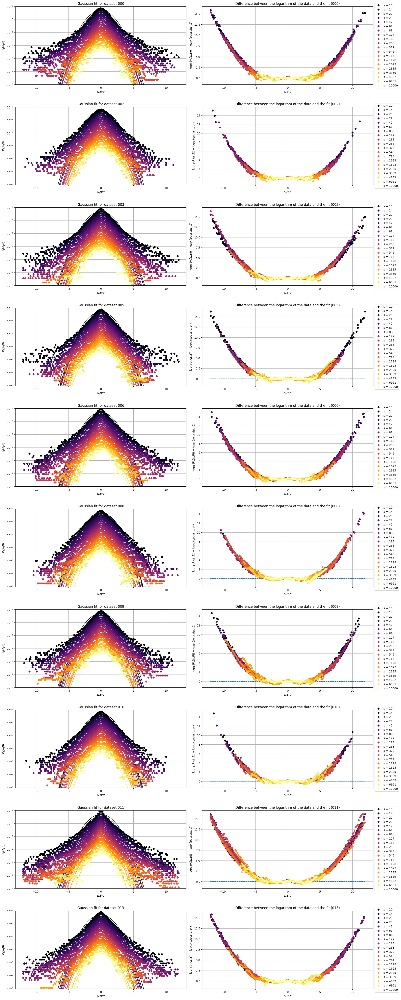

In [336]:
fig, axes = plt.subplots(10, 2, figsize=(20, 50))
colors = plt.cm.inferno(np.linspace(0, 1, len(s_list)))

for i in range(len(deltaBs)):
    ax_left = axes[i, 0] # Plot of the Gaussian distribution 
    ax_right = axes[i, 1] # Plot of the residuals
    
    ax_left.set_yscale('log') # Logaritmic scale
    ax_left.set_ylim(1e-8, 1e-2)
    ax_right.hlines(0, -12, 12, linestyles="dashed")
    ax_left.grid(True)
    ax_right.grid(True)
    ax_left.set_title(f"Gaussian fit for dataset {data_name[i]}")
    ax_right.set_title(f"Difference between the logarithm of the data and the fit ({data_name[i]})")
    ax_left.set_xlabel(r"$\Delta_s B / \sigma$")
    ax_left.set_ylabel(r"$P_s (\Delta_s B)$")
    ax_right.set_ylabel(r"$\log_{10}(P_s (\Delta_s B)) - \log_{10}(gauss(\mu, \sigma))$")
    ax_right.set_xlabel(r"$\Delta_s B / \sigma$")
    
    for j in range(len(s_list)):
        scale = s_list[j] # Time scale 
        data = deltaBs[i].iloc[j].to_numpy() # Convert to numpy array
        points = data[~np.isnan(data)] # Remove NaN values
        
        # Plot the Gaussian
        hist, bins = np.histogram(points, bins=150, range=(-12, 12))
        centers = (bins[:-1] + bins[1:]) / 2
        
        mu, sigma = norm.fit(points)
        fit = norm.pdf(centers, mu, sigma)
        fit = fit / (np.sum(fit) * scale)
        
        hist_plot = hist / (scale * np.sum(hist))
        ax_left.plot(centers, hist_plot, 'o', color=colors[j], label=f"s = {scale}")
        ax_left.plot(centers, fit, color=colors[j])
        
        # Plot the residuals
        residuals = np.log10(hist_plot) - np.log10(fit)
        ax_right.plot(centers, residuals, 'o', color=colors[j], label=f"s = {scale}")

    ax_right.legend(loc='center left', bbox_to_anchor=(1, 0.5))



plt.tight_layout()
plt.show()


The result shows that the human heart rate does not fit Gaussian distribution since it has fat tails.

**Key Observations:**


*   Around the center (0 on the x-axis), residuals are small, meaning the Gaussian approximation is good.

*   At both extremes (large positive/negative ΔsBΔs​B), residuals increase, meaning the Gaussian function underestimates the probability of extreme fluctuations.

*  The dashed black horizontal line at 0 indicates the ideal case where the fit perfectly matches the data.


## Castaing fit <a name="castaing"></a>


Castaing's equation yields:
$$
\tilde{P_s}(x) = \int P_L (\frac{x}{\sigma}) \frac{1}{\sigma} G_{s,L}(\ln \sigma) \ d(\ln \sigma)
$$
The authors of the paper assume that both $P_L$ and $G_{s,L}$ are Gaussian and write $d(ln\sigma) = \frac{d\sigma}{\sigma}$:
$$
\tilde{P}_s(x) = \int_{0}^{+\infty}\frac{1}{\sigma \sqrt{2\pi}} exp(-\frac{x^2}{2\sigma^2}){\frac{1}{\lambda \sqrt{2\pi}} exp(- \frac{ln^2 (\sigma)}{2\lambda^2}) \frac{d\sigma}{\sigma}}
$$

The reason behind choosing this particular equation is the fact that it displays fat tails which should fit the data better.


In [337]:
def Castaing_func(x, lambd):
    def integrand(sigma, x, lambd):
        return 1 / (2 * np.pi * lambd * sigma ** 2) * np.exp(
            - (x ** 2 / sigma ** 2 + np.log(sigma) ** 2 / lambd ** 2) / 2
        )
    # Integrates from 0 to infinity
    results = quad_vec(integrand, 1e-6, np.inf, args=(x, lambd)) # Quad_vec is used to integrate over an array
    return results[0]

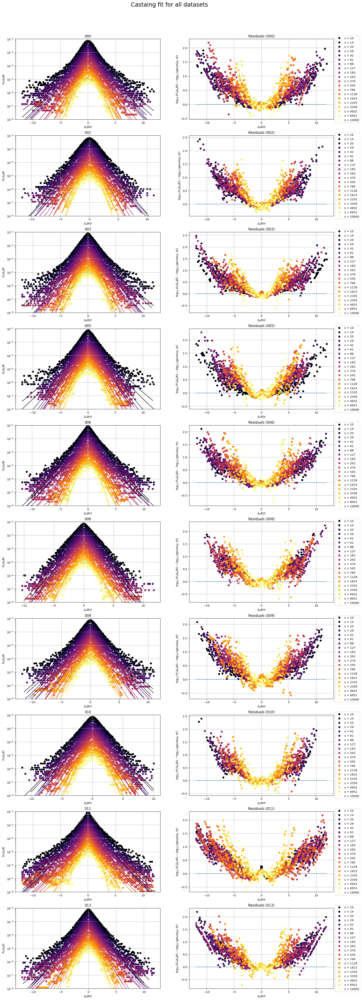

In [338]:
#Plotting the data against the fit and the residuals

#initialize the figure in exactly the same way as before
fig, axes = plt.subplots(10, 2, figsize=(20, 60))
colors = plt.cm.inferno(np.linspace(0, 1, len(s_list)))
lambda_all = []
lambda_err_all = []

fig.suptitle("Castaing fit for all datasets", fontsize=20, y=0.91)
# Loop over the datasets
for i in range(len(deltaBs)):
    ax_left = axes[i, 0]
    ax_right = axes[i, 1]

    ax_left.set_yscale('log')
    ax_left.set_ylim(1e-8, 1e-2)
    ax_right.hlines(0, -12, 12, linestyles="dashed")
    ax_left.grid(True)
    ax_right.grid(True)
    ax_left.set_title(f"{data_name[i]}")
    ax_right.set_title(f"Residuals ({data_name[i]})")
    ax_left.set_xlabel(r"$\Delta_s B / \sigma$")
    ax_left.set_ylabel(r"$P_s (\Delta_s B)$")
    ax_right.set_xlabel(r"$\Delta_s B / \sigma$")
    ax_right.set_ylabel(r"$\log_{10}(P_s (\Delta_s B)) - \log_{10}(gauss(\mu, \sigma))$")

    # Loop over the scales
    for j in range(len(s_list)):
        scale = s_list[j]
    
        data = deltaBs[i].iloc[j].to_numpy()
        points = data[~np.isnan(data)]
        hist, bins = np.histogram(points, bins=150, range=(-12, 12))

        # Exclude bins with zero counts.
        mask = hist != 0
        centers = (bins[:-1] + bins[1:]) / 2
        centers = centers[mask]
        hist = hist[mask]
        
        # Fit the Castaing function to the data
        parameters, cov = curve_fit(
            lambda x, lambd: np.log10(Castaing_func(x, lambd) / np.trapezoid(Castaing_func(x, lambd), x)),
            centers,
            np.log10(hist / np.sum(hist)),
            p0=0.6,
            bounds=[0.01, 2]
        )
        fit_c = Castaing_func(centers, parameters[0])#give values to the fit
        fit_c = fit_c / (np.sum(fit_c) * scale)#normalize the fit
        
        hist_plot = hist / (scale * np.sum(hist))#normalize the data
        ax_left.scatter(centers, hist_plot, color=colors[j], label=f"s = {scale}")
        ax_left.plot(centers, fit_c, color=colors[j])
        
        residuals = np.log10(hist_plot) - np.log10(fit_c)
        ax_right.plot(centers, residuals, 'o', color=colors[j], label=f"s = {scale}")

    ax_right.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

The fit above is done:
- For 3rd degree polynomial fit detrending 
- In logaritmic scale so that big and small probabilities contribute equally to the fitting process. 

The plots show that Castaing's function is a better fit to the data than a Gaussian. This results from the fact that the maximum residuals in this case are around 2 whereas is the previos fit they were aproximetly 15.

# Dependence of $\lambda^2$ on the time scales

The RR interval data was detrended with a polynomial degree of 3 at the beginning of this notebook.

In this section, the fitting parameters $\lambda^2$ were calculated for different detrending polynomial degrees. Therefore it's possible to compare the performance of different degrees. In order to calculate the $\lambda^2$ values, the Castaing's fit was done recursively over the polynomial degree range from 2 to 5.

In [339]:

# Gets the lambda values for different detrending polynomial degrees
lambda_all = []
lambda_err_all = []

for deg in range(2, 6):
    deltaBs = []

    for i in range(len(df)):
        row = df.iloc[i]
        data = row.to_numpy()
        data = data[~np.isnan(data)]
        deltaB = calculate_deltaB(data, s_list, deg)
        deltaBs.append(deltaB)

    lambda_all_deg = []
    lambda_err_all_deg = []

    for i in range(len(deltaBs)):
        lambdas = np.zeros(len(s_list))
        lambdas_err = np.zeros(len(s_list))

        for j in range(len(s_list)):
            scale = s_list[j]

            data = deltaBs[i].iloc[j].to_numpy()
            points = data[~np.isnan(data)]
            hist, bins = np.histogram(points, bins=150, range=(-12, 12))

            # Excludes bins with zero counts.
            mask = hist != 0
            centers = (bins[:-1] + bins[1:]) / 2
            centers = centers[mask]
            hist = hist[mask]

            # Fits the Castaing function to the data
            parameters, cov = curve_fit(
                lambda x, lambd: np.log10(Castaing_func(x, lambd) / np.trapezoid(Castaing_func(x, lambd), x)),
                centers,
                np.log10(hist / np.sum(hist)),
                p0=0.6,
                bounds=[0.1, 1]
            )

            std = np.sqrt(cov[0, 0])
            lambdas[j] = parameters[0]
            lambdas_err[j] = std

        lambda_all_deg.append(lambdas)
        lambda_err_all_deg.append(lambdas_err)

    lambda_all.append(lambda_all_deg)
    lambda_err_all.append(lambda_err_all_deg)

Below we plot the results for the dependence of $\lambda^2$ on the time scale parameter $s$.

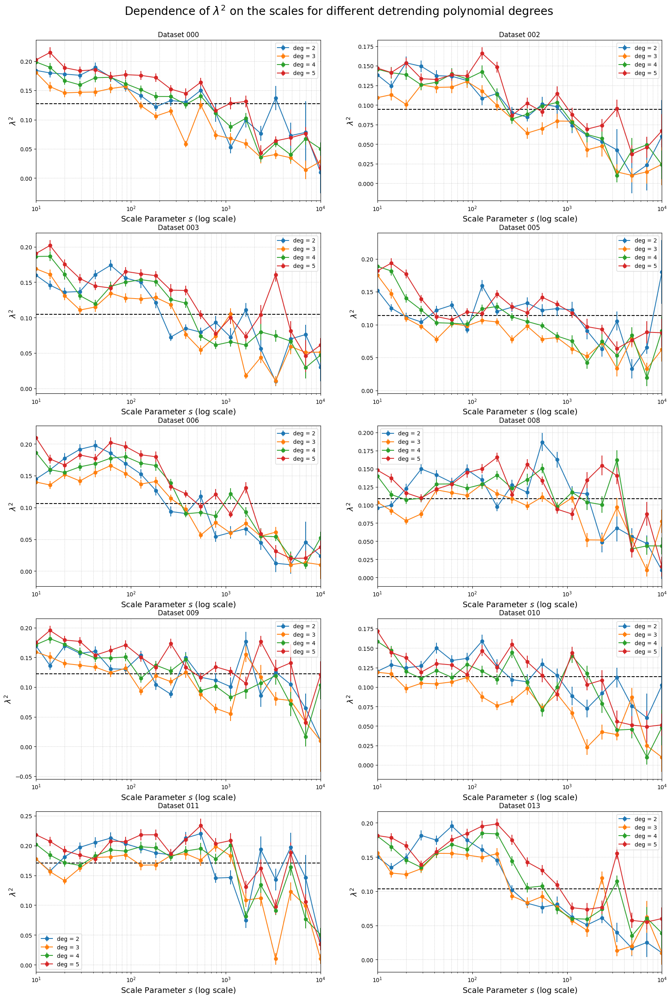

In [340]:
fig, axes = plt.subplots(5, 2, figsize=(20, 30))
fig.suptitle(r"Dependence of $\lambda^2$ on the scales for different detrending polynomial degrees", fontsize=20, y = 0.91)

colors = ['C0','C1','C2','C3']

for i in range(5):
    for j in range(2):
        ax = axes[i,j]
        ax.set_xscale('log')
        
        ax.set_xticks([10, 100, 1000, 10000])
        ax.set_xticklabels(["$10^1$", "$10^2$", "$10^3$", "$10^4$"])
        ax.set_xlim(1e1, 1e4)
        
        ax.set_xlabel(r"Scale Parameter $s$ (log scale)", fontsize=14)
        ax.set_ylabel(r"Variance Measure $\lambda^2$", fontsize=14)


        ax.set_ylabel(r"$\lambda^2$")
        ax.set_title(f"Dataset {data_name[i * 2 + j]}")
        ax.grid(True, which='both', linestyle='--', linewidth=0.5, alpha=0.7)

        ax.axhline(y=np.mean(np.array(lambda_all[0][i * 2 + j]) ** 2), color='black', linestyle='--')

        for deg in range(4):
            lambda_sq = np.array(lambda_all[deg][i * 2 + j]) ** 2
            lambda_err_sq = 2 * np.array(lambda_all[deg][i * 2 + j]) * np.array(lambda_err_all[deg][i * 2 + j])
            ax.errorbar(s_list, lambda_sq, yerr=lambda_err_sq, fmt='o-', label=f"deg = {deg + 2}")
        ax.legend()

Most of the graphs for $\lambda^2$ for different detrending degrees show a robust scale invariance across time scales $10^1$ and $10^3$.

Some of the plots hint a downward trend as the time scales increase. As the time scales are set one order of magnitude higher than the data in the original paper, the downward trend becomes more obvious. As the time scales increase, the PDF of the RR beat intervals become more Gaussian. Even though the original research paper shows otherwise, this observation is not enough to say it contradicts their results. The difference in the results could be explained by multiple factors such as the  such as the ages of the healthy individuals and whether they were in an quiescent or dynamical state. Nevertheless, the source of the dataset we used does not explicitly imply the idle/dynamical state of the individuals.


# Collapse plots

Collapse plots for each dataset is plotted below.

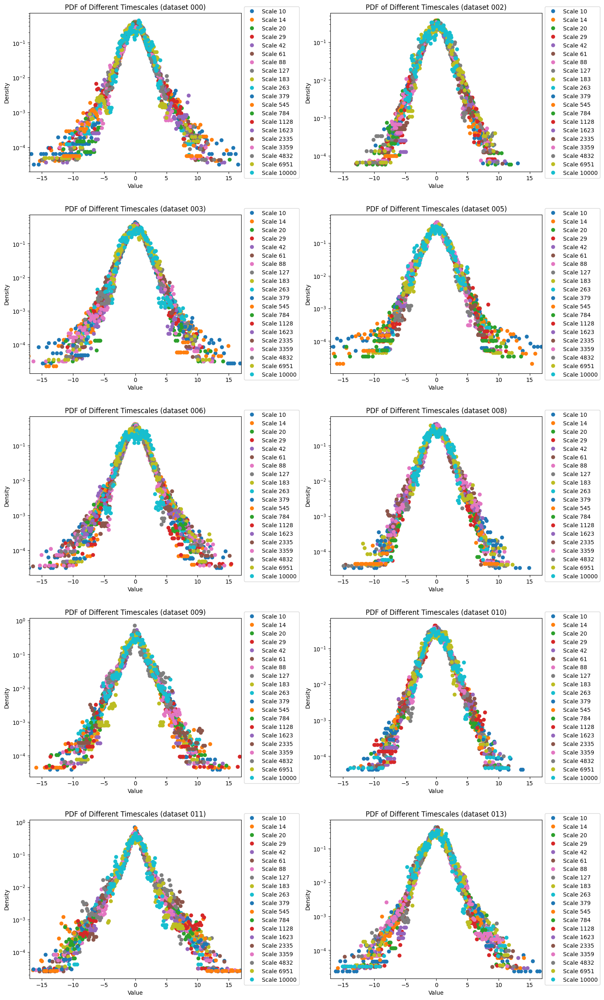

In [341]:
plt.figure(figsize=(15, 25))  

for i in range(len(data_name)):
    dataset = deltaBs[i]
    
    for j in range(len(s_list)):
        data = dataset.iloc[j].dropna().to_numpy() # convert the data into Numpy array and remove NaN values

        # plot the histogram of the data
        density, bins = np.histogram(data, bins=100, density=True)
        centers = (bins[:-1] + bins[1:]) / 2  # Get bin centers
        plt.subplot(5,2,i+1)
        plt.plot(centers, density, "o",label=f"Scale {s_list[j]}")  # Line plot for density
        plt.yscale("log")
        plt.xlim(-17,17)
        plt.title(f"PDF of Different Timescales (dataset {data_name[i]})")
        plt.xlabel("Value")
        plt.ylabel("Density")
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.tight_layout()
plt.show()


# Conclusion

- The probability density function (PDF) of heart rate
fluctuations is scale invariant.
- The distributions showed heavy-tailed, non-Gaussian behavior, indicating strong fluctuations and intermittency.
- As the scale increased, λ**2 initially decreased, suggesting a reduction in small-scale fluctuations.
- In larger scales (s>1000), λ**2 continued decreasing, hinting that the system was approaching a more Gaussian-like regime, potentially due to diffusive effects or central limit theorem dynamics.
- The collapse plot analysis showed a universal rescaled function could describe the probability distributions across all scales.

If the data had fit a Gaussian distribution in all scales, we could infer that heart rate variations result from a simple, independent, and normally distributed stochastic process. 

However, since this model doesn't accurately describe heart rate variations, it indicates that heart rate dynamics are not purely random but follow a structured and law-governed mechanism.

These findings suggest that heart rate dynamics behave more like a system near a critical state, where variations exhibit scale-invariant properties and a complex, self-organized structure
